# Landcover classification
Demonstrate how one could use Julia to participate in the OGH2023 hackathon. By Maarten Pronk ([@evetion](https://github.com/evetion)).
This is a reproduceable notebook to produce a landcover classification. Challenge is described [at kaggle](https://www.kaggle.com/competitions/ogh2023).

Input (landsat 8 scene) is provided. We add:
- Roughness of B1
- Ridge detection of B8

Output:
- Landcover classification

## Input data

In [1]:
using Pkg
using Rasters, ArchGDAL, Plots, DataFrames
using RemoteSensingToolbox, Rasters
using ImageShow
using Geomorphometry

[ Info: Precompiling RemoteSensingToolbox [c88070b3-ddf6-46c7-b699-196056389566]


Let's retrieve all landsat scene files and load the high resolution file.

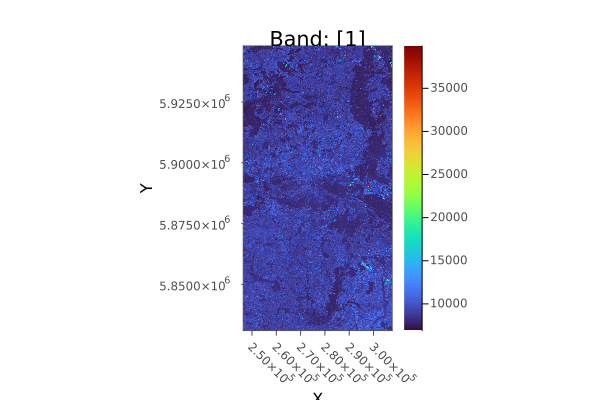

In [13]:
folder = "/Users/evetion/Downloads/ogh2023/Landast"  # typo comes from the zipfile
tifs = sort(filter(endswith("TIF"), readdir(folder, join=true)))
b8, stack... = tifs  # split into 1, many
highres = Raster(b8)
plot(highres; max_res=2000, c=:turbo)

The other lowres bands can be read instantly by using the [RemoteSensingToolbox](https://github.com/JoshuaBillson/RemoteSensingToolbox.jl) package.

In [14]:
landsat = read_bands(Landsat8, "/Users/evetion/Downloads/ogh2023/Landast")

RasterStack with dimensions: 
  X Projected{Float64} LinRange{Float64}(246375.0, 307635.0, 2043) ForwardOrdered Regular Intervals crs: WellKnownText,
  Y Projected{Float64} LinRange{Float64}(5.948e6, 5.831e6, 3901) ReverseOrdered Regular Intervals crs: WellKnownText
and 7 layers:
  :B1 UInt16 dims: X, Y (2043×3901)
  :B2 UInt16 dims: X, Y (2043×3901)
  :B3 UInt16 dims: X, Y (2043×3901)
  :B4 UInt16 dims: X, Y (2043×3901)
  :B5 UInt16 dims: X, Y (2043×3901)
  :B6 UInt16 dims: X, Y (2043×3901)
  :B7 UInt16 dims: X, Y (2043×3901)


It has specific methods for Landsat8, such as visualizing combinations of specific bands.

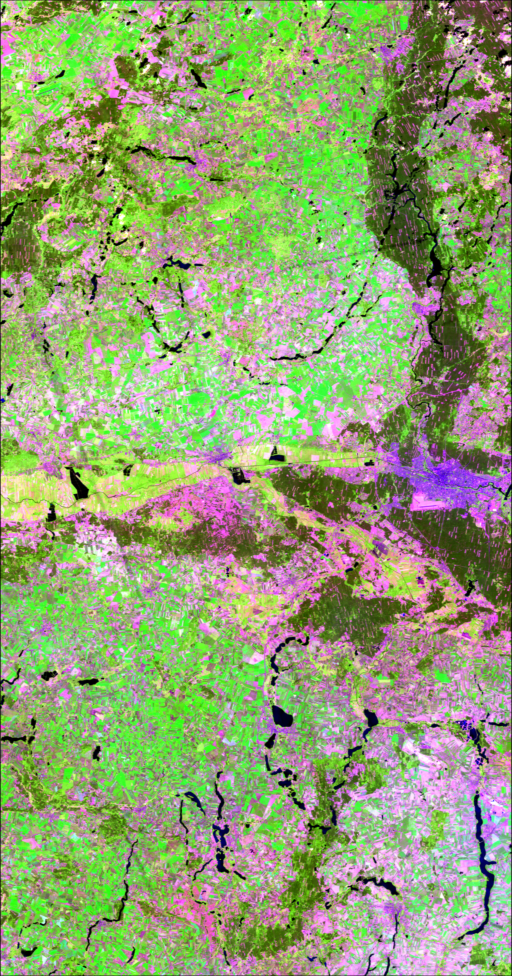

In [15]:
visualize(landsat, Agriculture{Landsat8}; upper=0.90)

Let's change the underlying values to reflectance

In [16]:
landsat_sr = dn_to_reflectance(Landsat8, landsat)

RasterStack with dimensions: 
  X Projected{Float64} LinRange{Float64}(246375.0, 307635.0, 2043) ForwardOrdered Regular Intervals crs: WellKnownText,
  Y Projected{Float64} LinRange{Float64}(5.948e6, 5.831e6, 3901) ReverseOrdered Regular Intervals crs: WellKnownText
and 7 layers:
  :B1 Float32 dims: X, Y (2043×3901)
  :B2 Float32 dims: X, Y (2043×3901)
  :B3 Float32 dims: X, Y (2043×3901)
  :B4 Float32 dims: X, Y (2043×3901)
  :B5 Float32 dims: X, Y (2043×3901)
  :B6 Float32 dims: X, Y (2043×3901)
  :B7 Float32 dims: X, Y (2043×3901)


## Derive features
And then derive several spectral features, based on a 5min Google search.

In [17]:
# From https://yceo.yale.edu/tasseled-cap-transform-landsat-8-oli
function brightness(ls, ::Type{Landsat8})  # we copy the type signature to match RemoteSensingToolbox calls
    b1 = ls[:B1]
    b2 = ls[:B2]
    b3 = ls[:B3]
    b4 = ls[:B4]
    b5 = ls[:B5]
    b6 = ls[:B6]
    b1*0.3029+b2*0.2786+b3*0.4733+b4*0.5599+b5*0.508+b6*0.1872
end
function greenness(ls, ::Type{Landsat8})
    b1 = ls[:B1]
    b2 = ls[:B2]
    b3 = ls[:B3]
    b4 = ls[:B4]
    b5 = ls[:B5]
    b6 = ls[:B6]
    b1*(-0.2941)+b2*(-0.243)+b3*(-0.5424)+b4*0.7276+b5*0.0713+b6*(-0.1608)
end
function wetness(ls, ::Type{Landsat8})
    b1 = ls[:B1]
    b2 = ls[:B2]
    b3 = ls[:B3]
    b4 = ls[:B4]
    b5 = ls[:B5]
    b6 = ls[:B6]
    b1*0.1511+b2*0.1973+b3*0.3283+b4*0.3407+b5*(-0.7117)+b6*(-0.4559)
end
# Normally used for DEMs, but works in a 3x3 window, so takes into account neighbors. Note that this is the only pixel value to do so.
function roughness(ls, ::Type{Landsat8})
    Geomorphometry.roughness(ls[:B1])
end
# From https://www.jetir.org/papers/JETIRAK06043.pdf, trying to find road extraction feature
function rei(ls, ::Type{Landsat8})
    (ls[:B7] .- ls[:B2]) ./ (ls[:B7] .+ ls[:B2])
end

rei (generic function with 1 method)

We add all these spectral features together in a new RasterStack.

In [18]:
# List of functions
functions = [mndwi, ndbi, ndmi, ndvi, savi, brightness, greenness, wetness, roughness, rei]
# Map each function to the rasterstack, and combine these rasters into a new RasterStack
smrs = RasterStack(
    NamedTuple(
        zip(
            Symbol.(functions), # name of function 
            map(x->x(landsat_sr, Landsat8), functions)  # apply function
        )
    )
)

RasterStack with dimensions: 
  X Projected{Float64} LinRange{Float64}(246375.0, 307635.0, 2043) ForwardOrdered Regular Intervals crs: WellKnownText,
  Y Projected{Float64} LinRange{Float64}(5.948e6, 5.831e6, 3901) ReverseOrdered Regular Intervals crs: WellKnownText
and 10 layers:
  :mndwi      Float32 dims: X, Y (2043×3901)
  :ndbi       Float32 dims: X, Y (2043×3901)
  :ndmi       Float32 dims: X, Y (2043×3901)
  :ndvi       Float32 dims: X, Y (2043×3901)
  :savi       Float32 dims: X, Y (2043×3901)
  :brightness Float64 dims: X, Y (2043×3901)
  :greenness  Float64 dims: X, Y (2043×3901)
  :wetness    Float64 dims: X, Y (2043×3901)
  :roughness  Float32 dims: X, Y (2043×3901)
  :rei        Float32 dims: X, Y (2043×3901)


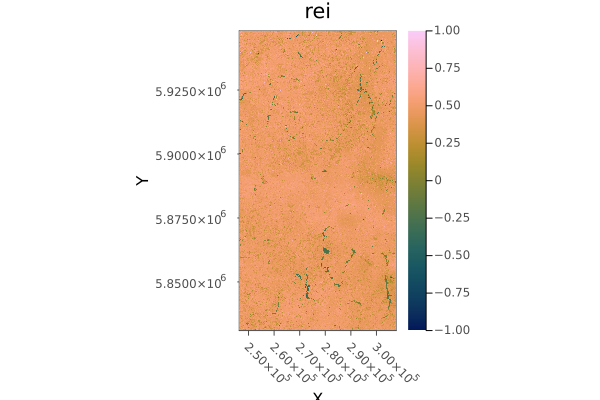

In [22]:
plot(smrs[:rei], clim=(-1,1))  # Not sure if this has an effect

Let's detect ridges, hopefully roadlike things, in the high-resolution image.

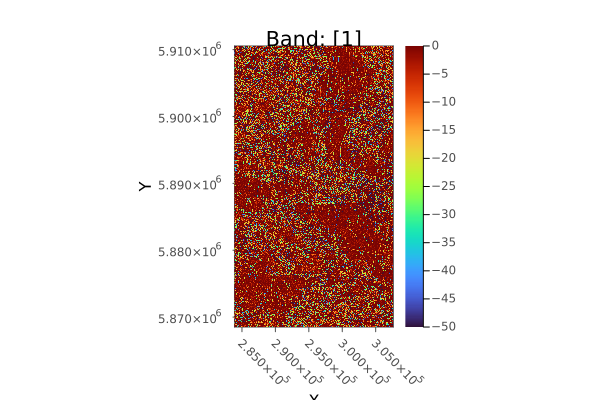

In [35]:
using ImageFiltering
σ = 3
out2 = imfilter(highres, Kernel.LoG(σ))  # Laplacian of Gaussians
plot(out2[2500:end, 2500:end-2500], clim=(-50, 0), c=:turbo)

This seems to do something. But since it ran on the high resolution B8 band, we resample all to the lower-resolution other bands, so sampling is straightforward. Note that sampling (or resampling with a specific reducer) on this higher resolution image might be better, as roads can be small.

In [38]:
lowres = resample(highres; to=smrs)  # this actually calls gdalwarp
ridge = resample(out2*1000; to=smrs)
ridge[isinf.(ridge)] .= 0.0  # Infinite is hard to train on

# Also correct high-res band to reflectance
lowresn = dn_to_reflectance(Landsat8, lowres)  # not sure if this correct (and notice we didn't do anything about the clouds that are in there).
lowresn[isinf.(lowresn)] .= 0.0;

Finally we stack everything together, so we have a stack on which we can train.

In [102]:
crst = RasterStack(landsat_sr..., smrs..., RasterStack((;lowres=lowresn, ridge=ridge))...)

RasterStack with dimensions: 
  X Projected{Float64} LinRange{Float64}(246375.0, 307635.0, 2043) ForwardOrdered Regular Intervals crs: WellKnownText,
  Y Projected{Float64} LinRange{Float64}(5.948e6, 5.831e6, 3901) ReverseOrdered Regular Intervals crs: WellKnownText
and 19 layers:
  :B1         Float32 dims: X, Y (2043×3901)
  :B2         Float32 dims: X, Y (2043×3901)
  :B3         Float32 dims: X, Y (2043×3901)
  :B4         Float32 dims: X, Y (2043×3901)
  :B5         Float32 dims: X, Y (2043×3901)
  :B6         Float32 dims: X, Y (2043×3901)
  :B7         Float32 dims: X, Y (2043×3901)
  :mndwi      Float32 dims: X, Y (2043×3901)
  :ndbi       Float32 dims: X, Y (2043×3901)
  :ndmi       Float32 dims: X, Y (2043×3901)
  :ndvi       Float32 dims: X, Y (2043×3901)
  :savi       Float32 dims: X, Y (2043×3901)
  :brightness Float64 dims: X, Y (2043×3901)
  :greenness  Float64 dims: X, Y (2043×3901)
  :wetness    Float64 dims: X, Y (2043×3901)
  :roughness  Float32 dims: X, Y (2043×3901

Note that these are many features already, and some don't add much information at all. One could use [PCA](https://joshuabillson.github.io/RemoteSensingToolbox.jl/stable/#Principal-Component-Analysis) to reduce the number of bands. Be careful though, as we don't know yet how these features relate to the landcover classes.

## Training and test datasets
With our features complete, let's load the test and training datasets. We add them together, and combine them with our feature data to create one large DataFrame with *all* data.

In [106]:
Xr = Raster(joinpath(folder, "..", "training_set.tif"))
Yr = Raster(joinpath(folder, "..", "validation_set.tif"))

# Resample our stack to these datasets
trainrs = RasterStack(resample(crst; to=Xr)..., RasterStack((;class=Xr))...)
valrs = RasterStack(resample(crst; to=Yr)..., RasterStack((;class=Yr))...)

# For debugging, let's write out our input data.
Rasters.write("trainbands.tif", Raster(trainrs), force=true)
Rasters.write("valbinds.tif", Raster(valrs), force=true)

# Calling DataFrame on a RasterStack will transform it into a Table of rows for each cell
traind = DataFrame(trainrs)
vald = DataFrame(valrs)
combined = vcat(traind, vald)

# Drop 0 as class?
subset!(combined, :class => c -> c.!= 0)

# drop row if it contains Inf
combined = combined[any.(eachrow(isinf.(combined))), :]

# drop X Y, as I believe these do not matter so much
select!(combined, Not([:X, :Y]))

combined

Row,B1,B2,B3,B4,B5,B6,B7,mndwi,ndbi,ndmi,ndvi,savi,brightness,greenness,wetness,roughness,rei,lowres,ridge,class
,Float32,Float32,Float32,Float32,Float32,Float32,Float32,Float32,Float32,Float32,Float32,Float32,Float64,Float64,Float64,Float32,Float32,Float32,Float64,UInt8
1,-0.05062,-0.0192975,0.048655,0.04101,0.323985,0.139653,0.08017,-0.483239,-0.397579,0.397579,0.775285,0.541524,0.216008,0.023669,-0.275758,Inf,1.63403,0.046125,61952.3,4
2,-0.0973425,-0.05062,0.04068,0.0385625,0.30281,0.144575,0.0905375,-0.560821,-0.353689,0.353689,0.774074,0.523479,0.178149,0.045265,-0.279624,Inf,3.53623,0.0528625,39320.9,4
3,-0.04787,-0.0140725,0.0546775,0.05212,0.329458,0.163632,0.0990075,-0.499084,-0.336298,0.336298,0.726818,0.518368,0.234637,0.0229418,-0.283377,Inf,1.33137,0.05256,36766.3,4
4,-0.156303,-0.0843625,0.0261325,0.0303675,0.299125,0.161075,0.09722,-0.720818,-0.299978,0.299978,0.815671,0.542004,0.140633,0.0698165,-0.307658,Inf,14.1227,0.04442,2670.98,4
5,Inf,-0.18768,0.00113499,0.0315775,0.304817,0.218853,0.13924,-0.989681,-0.164159,0.164159,0.812259,0.545336,Inf,-Inf,Inf,NaN,-6.74897,0.04915,-62675.1,4
6,-0.104933,-0.0427275,0.0646325,0.0797025,0.30534,0.235243,0.17543,-0.568937,-0.12967,0.12967,0.586007,0.419692,0.230678,0.0481221,-0.300469,Inf,1.64396,0.0711225,-53179.4,4
7,-0.15611,-0.116263,0.076375,0.0650725,0.29874,0.27663,0.241732,-0.567287,-0.0384275,0.0384275,0.642275,0.447928,0.196451,0.0569028,-0.338012,Inf,2.85323,0.12021,-69675.9,2
8,0.058885,0.07236,0.18302,0.181782,0.324618,0.34901,0.349972,-0.311994,0.0362106,-0.0362106,0.28206,0.227129,0.45664,-0.0348822,-0.244951,Inf,0.657332,0.316615,-1.71894e5,2
9,-0.131113,-0.0427,0.095625,0.13253,0.287713,0.29302,0.238047,-0.507906,0.00913931,-0.00913931,0.369269,0.275101,0.268864,0.0668944,-0.290042,Inf,1.43717,0.16663,-1.59984e5,2


Note that there is a strong imbalance in the classes. Especially class 5 (undefined, roads and such) is underrepresented.

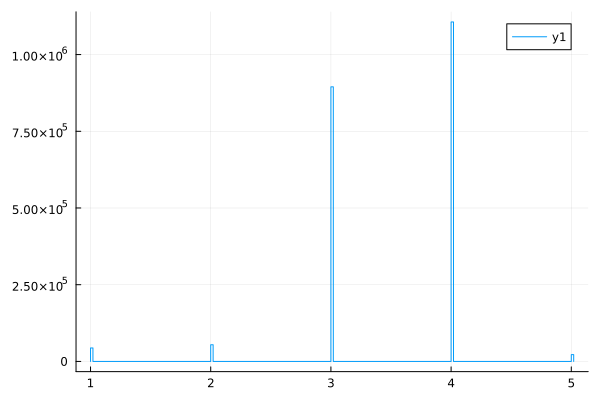

In [49]:
histogram(cX.class)

To start training on this (now vector) dataset, we need to set the specific type in Julia. You might consider this odd, but a UInt8 value could be a category or a continuous variable (the default).

In [59]:
using ScientificTypes
cX.class = coerce(cX.class, Multiclass)
describe(cX)  # Useful to check for Inf, NaNs or other odd patterns that might disturb our model.

Row,variable,mean,min,median,max,nmissing,eltype
,Symbol,Union…,Any,Union…,Any,Int64,DataType
1,B1,0.0258209,-0.19549,0.023135,0.515055,0,Float32
2,B2,0.0359458,-0.152122,0.032485,0.603825,0,Float32
3,B3,0.0699633,-0.0157775,0.0684825,0.677828,0,Float32
4,B4,0.0621506,-0.029885,0.057125,0.743608,0,Float32
5,B5,0.328105,0.01197,0.327918,0.91056,0,Float32
6,B6,0.176535,0.00396749,0.170425,1.18949,0,Float32
7,B7,0.104205,0.00369249,0.0925175,1.44739,0,Float32
8,mndwi,-0.422946,-2.09225,-0.450865,0.702698,0,Float32
9,ndbi,-0.300673,-0.723134,-0.318125,0.343496,0,Float32


In [52]:
schema(cX)

┌────────────┬───────────────┬─────────────────────────────────┐
│ names      │ scitypes      │ types                           │
├────────────┼───────────────┼─────────────────────────────────┤
│ B1         │ Continuous    │ Float32                         │
│ B2         │ Continuous    │ Float32                         │
│ B3         │ Continuous    │ Float32                         │
│ B4         │ Continuous    │ Float32                         │
│ B5         │ Continuous    │ Float32                         │
│ B6         │ Continuous    │ Float32                         │
│ B7         │ Continuous    │ Float32                         │
│ mndwi      │ Continuous    │ Float32                         │
│ ndbi       │ Continuous    │ Float32                         │
│ ndmi       │ Continuous    │ Float32                         │
│ ndvi       │ Continuous    │ Float32                         │
│ savi       │ Continuous    │ Float32                         │
│ brightness │ Continuous

## Modeling
Now for the actual ML part (much of all ML time spent is on data handling).

In [61]:
using MLJ

In [62]:
y, x = unpack(cX, ==(:class); rng=123)

(CategoricalArrays.CategoricalValue{UInt8, UInt32}[0x04, 0x04, 0x03, 0x04, 0x03, 0x04, 0x03, 0x03, 0x04, 0x04  …  0x03, 0x04, 0x03, 0x04, 0x03, 0x03, 0x04, 0x01, 0x03, 0x04], 2121235×19 DataFrame
     Row │ B1          B2         B3         B4         B5         B6          ⋯
         │ Float32     Float32    Float32    Float32    Float32    Float32     ⋯
─────────┼──────────────────────────────────────────────────────────────────────
       1 │ 0.0511025   0.058115   0.0826725  0.0841025  0.301188   0.253613    ⋯
       2 │ 0.0154075   0.0272325  0.06752    0.052395   0.367985   0.146885
       3 │ 0.0128225   0.018075   0.038975   0.027755   0.267445   0.12153
       4 │ 0.0139775   0.02748    0.07489    0.0628175  0.346233   0.146115
       5 │ 0.0226675   0.0392225  0.068235   0.0722225  0.217065   0.195862    ⋯
       6 │ 0.0188725   0.031935   0.0638075  0.061525   0.263017   0.132805
       7 │ 0.0234925   0.029625   0.0493975  0.04486    0.214095   0.13715
       8 │ 0.0266275 

In [63]:
Pkg.add("MLJXGBoostInterface")
Tree = @load XGBoostClassifier pkg=XGBoost
tree = Tree()  # no hypertuning yet

   Resolving package versions...
  No Changes to `~/code/Project.toml`
  No Changes to `~/code/Manifest.toml`


import MLJXGBoostInterface ✔


[ Info: For silent loading, specify `verbosity=0`. 


XGBoostClassifier(
  test = 1, 
  num_round = 100, 
  booster = "gbtree", 
  disable_default_eval_metric = 0, 
  eta = 0.3, 
  num_parallel_tree = 1, 
  gamma = 0.0, 
  max_depth = 6, 
  min_child_weight = 1.0, 
  max_delta_step = 0.0, 
  subsample = 1.0, 
  colsample_bytree = 1.0, 
  colsample_bylevel = 1.0, 
  colsample_bynode = 1.0, 
  lambda = 1.0, 
  alpha = 0.0, 
  tree_method = "auto", 
  sketch_eps = 0.03, 
  scale_pos_weight = 1.0, 
  updater = nothing, 
  refresh_leaf = 1, 
  process_type = "default", 
  grow_policy = "depthwise", 
  max_leaves = 0, 
  max_bin = 256, 
  predictor = "cpu_predictor", 
  sample_type = "uniform", 
  normalize_type = "tree", 
  rate_drop = 0.0, 
  one_drop = 0, 
  skip_drop = 0.0, 
  feature_selector = "cyclic", 
  top_k = 0, 
  tweedie_variance_power = 1.5, 
  objective = "automatic", 
  base_score = 0.5, 
  watchlist = nothing, 
  nthread = 8, 
  importance_type = "gain", 
  seed = nothing, 
  validate_parameters = false, 
  eval_metric = String

In [64]:
mach = machine(tree, x, y)

untrained Machine; caches model-specific representations of data
  model: XGBoostClassifier(test = 1, …)
  args: 
    1:	Source @371 ⏎ Table{AbstractVector{Continuous}}
    2:	Source @656 ⏎ AbstractVector{Multiclass{5}}


In [65]:
pe = evaluate!(mach, resampling=StratifiedCV(; nfolds=6,
                               shuffle=true),
                 measures=[balanced_accuracy, kappa],
                 verbosity=1)

Evaluating over 6 folds: 100%[=========================] Time: 0:48:19


PerformanceEvaluation object with these fields:
  measure, operation, measurement, per_fold,
  per_observation, fitted_params_per_fold,
  report_per_fold, train_test_rows
Extract:
┌─────────────────────┬──────────────┬─────────────┬─────────┬──────────────────
│ measure             │ operation    │ measurement │ 1.96*SE │ per_fold        ⋯
├─────────────────────┼──────────────┼─────────────┼─────────┼──────────────────
│ BalancedAccuracy(   │ predict_mode │ 0.604       │ 0.00147 │ [0.605, 0.601,  ⋯
│   adjusted = false) │              │             │         │                 ⋯
│ Kappa()             │ predict_mode │ 0.807       │ 0.00052 │ [0.807, 0.806,  ⋯
└─────────────────────┴──────────────┴─────────────┴─────────┴──────────────────
                                                                1 column omitted


In [66]:
pe.measurement

2-element Vector{Float64}:
 0.604350054411069
 0.8067220895407315

These results look okaish, but can certainly be improved. Ideally one would:
- Reduce training time (by reducing features)
- Inspect feature importance
- Inspect lowest scoring classes (undeveloped class 5) in relation to features

## Prediction

With our trained model, let's first we create a prediction map to inspect our results. We create a DataFrame of our raster stack and input it to the model to predict values for our whole landsat scene.


In [78]:
# Make a prediction map
dfn = DataFrame(crst)
select!(dfn, Not([:X, :Y]))
dfn .= ifelse.(isinf.(dfn), 0.0, dfn)  # set any non-finite values to 0
pred = predict_mode(mach, dfn)

7969743-element CategoricalArrays.CategoricalArray{UInt8,1,UInt32}:
 0x01
 0x03
 0x03
 0x03
 0x03
 0x03
 0x03
 0x03
 0x03
 0x03
 0x03
 0x03
 0x03
 ⋮
 0x03
 0x03
 0x03
 0x03
 0x03
 0x03
 0x03
 0x03
 0x03
 0x03
 0x03
 0x03

We can reshape this vector of predictions into the raster form (the inverse of the DataFrame operation).

┌ Warning: `missing` cant be written to .tif, missinval for `UInt32` of `4294967295` used instead
└ @ Rasters ~/.julia/packages/Rasters/47MWf/src/utils.jl:32


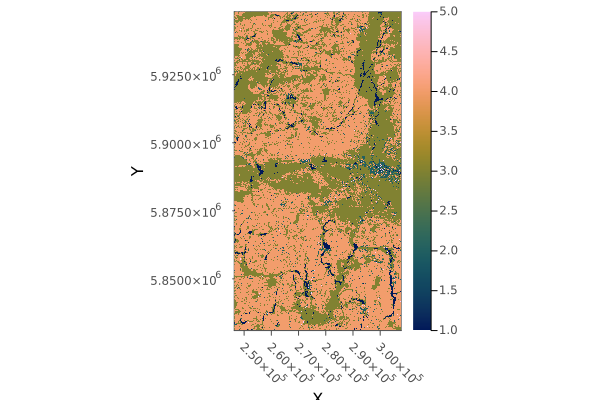

In [79]:
pr = Raster(int.(reshape(pred, size(srs)[1:2])), dims=dims(srs))
Rasters.write("prediction.tif", pr, force=true)
plot(pr)

## Submission
Let's load the file with the points to be predicted and create our submission.csv.

In [68]:
using CSV
df = CSV.read(joinpath(folder, "..", "submission.csv"), DataFrame)
geometry = zip(df.Y, df.X)  # make an (implicit) point that Rasters can use for sampling
df

Row,ID,X,Y,category
,Int64,Float64,Float64,String3
1,1,4.09131e5,532574.0,NA
2,2,4.18181e5,540287.0,NA
3,3,4.33303e5,5.65382e5,NA
4,4,4.01445e5,558185.0,NA
5,5,4.3286e5,5.49954e5,NA
6,6,4.22147e5,5.5111e5,NA
7,7,4.20718e5,5.64889e5,NA
8,8,4.00312e5,5.50528e5,NA
9,9,4.09671e5,5.35409e5,NA


Sadly, not all data is in the same coordinate reference system, so here I project all submission points to the one of the raster. This is faster than the other way around.

In [83]:
using Proj
trans = Proj.Transformation("EPSG:2180", "EPSG:32634")
np = trans.(geometry)

11089-element Vector{Tuple{Float64, Float64}}:
 (273835.179029267, 5.838726329239982e6)
 (283104.33198141155, 5.846191084579964e6)
 (298930.12895827554, 5.8708747066642335e6)
 (266859.24824864336, 5.86456275069286e6)
 (298057.37145709933, 5.855453116043926e6)
 (287372.51424354216, 5.856907964241545e6)
 (286327.3248015798, 5.870732207417169e6)
 (265512.49169201485, 5.856933581449814e6)
 (274454.3807359721, 5.841547744245808e6)
 (279443.4042761496, 5.83653763368146e6)
 (290621.67190626595, 5.88145103838913e6)
 (274722.91540568986, 5.857807774409168e6)
 (267338.0348033956, 5.864797326644369e6)
 ⋮
 (292447.9119871984, 5.878136110868777e6)
 (284277.1685591929, 5.857489956981629e6)
 (266619.4299403647, 5.851790333031429e6)
 (275981.736765133, 5.859869547691904e6)
 (277178.92529000354, 5.854994545333261e6)
 (265540.09238937247, 5.849661264884725e6)
 (294268.81199749594, 5.865467640499927e6)
 (287612.73477495473, 5.869276217833487e6)
 (286582.0663878548, 5.871122634843147e6)
 (265149.352247276

Now we use these points to sample our Rasterstack `crst` and dump the geometry column (which our model can't use). We again predict the classification.


In [84]:
dfn = DataFrame(extract(crst, np))
select!(dfn, Not(:geometry))
pred = predict_mode(mach, dfn)

11089-element CategoricalArrays.CategoricalArray{UInt8,1,UInt32}:
 0x03
 0x04
 0x04
 0x04
 0x04
 0x03
 0x03
 0x04
 0x03
 0x03
 0x04
 0x04
 0x04
 ⋮
 0x04
 0x04
 0x04
 0x04
 0x04
 0x04
 0x04
 0x04
 0x03
 0x04
 0x04
 0x04

In [85]:
# In our submission, the classes must be strings, so we convert here
class = ["water", "buildings", "vegetation", "cropland", "undeveloped"]
classes = class[int.(pred)]

# New dataframe for submission
cdf = DataFrame(ID=df.ID, category=classes)  # Kaggle doesn't accept any other columns

# Update input dataframe
df.category .= classes;

In [86]:
CSV.write("for_submission.csv", cdf)  # for submission
CSV.write("to_inspect.csv", df)  # for inspection (with x, y)

"to_inspect.csv"

## Further reading
The [MLJ manual](https://alan-turing-institute.github.io/MLJ.jl/dev/) will help you explore further ML options in Julia.